In [1]:
using DelimitedFiles


In [2]:
A = readdlm("../../dat/admission.txt", ',')
# output vector
y = Int.(A[:,3])
X = A[:,1:2]

100×2 Array{Float64,2}:
 34.6237  78.0247
 30.2867  43.895 
 35.8474  72.9022
 60.1826  86.3086
 79.0327  75.3444
 45.0833  56.3164
 61.1067  96.5114
 75.0247  46.554 
 76.0988  87.4206
 84.4328  43.5334
 95.8616  38.2253
 75.0137  30.6033
 82.3071  76.482 
  ⋮              
 78.6354  96.6474
 52.348   60.7695
 94.0943  77.1591
 90.4486  87.5088
 55.4822  35.5707
 74.4927  84.8451
 89.8458  45.3583
 83.4892  48.3803
 42.2617  87.1039
 99.315   68.7754
 55.34    64.9319
 74.7759  89.5298

In [3]:
using Plots

In [4]:
y

100-element Array{Int64,1}:
 0
 0
 0
 1
 1
 0
 1
 1
 1
 1
 0
 0
 1
 ⋮
 1
 0
 1
 1
 0
 1
 1
 1
 1
 1
 1
 1

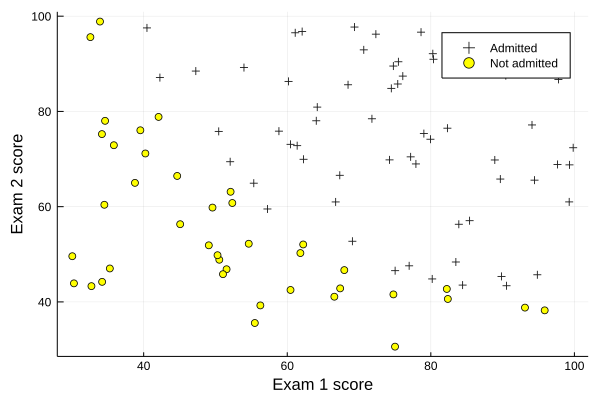

In [5]:
pos = (y .== 1)
scatter(X[pos,1], X[pos,2], label="Admitted", markershape=:+, color=:black, xlabel="Exam 1 score", ylabel="Exam 2 score")
neg = (y .== 0)
scatter!(X[neg,1], X[neg,2], label="Not admitted", color=:yellow)

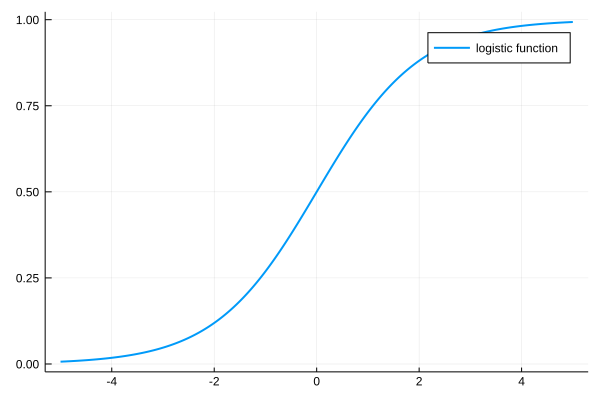

In [6]:
# Implement logistic function: g(z) = 1 / (1 + exp(-z))
g(z) = 1 ./ (1 .+ exp.(-z))

z = -5:0.01:5
plot(z, g(z), label="logistic function", linewidth=2)

In [7]:
N = length(y)
X = hcat(ones(N), X)

100×3 Array{Float64,2}:
 1.0  34.6237  78.0247
 1.0  30.2867  43.895 
 1.0  35.8474  72.9022
 1.0  60.1826  86.3086
 1.0  79.0327  75.3444
 1.0  45.0833  56.3164
 1.0  61.1067  96.5114
 1.0  75.0247  46.554 
 1.0  76.0988  87.4206
 1.0  84.4328  43.5334
 1.0  95.8616  38.2253
 1.0  75.0137  30.6033
 1.0  82.3071  76.482 
 ⋮                    
 1.0  78.6354  96.6474
 1.0  52.348   60.7695
 1.0  94.0943  77.1591
 1.0  90.4486  87.5088
 1.0  55.4822  35.5707
 1.0  74.4927  84.8451
 1.0  89.8458  45.3583
 1.0  83.4892  48.3803
 1.0  42.2617  87.1039
 1.0  99.315   68.7754
 1.0  55.34    64.9319
 1.0  74.7759  89.5298

In [8]:
# Implement Batch Gradient Descent algorithm
function loss(θ::Array{Float64})::Float64
    h = g(X*θ) # a column vector of h    
    J = y' * log.(h) + (1 .- y)' * log.(1 .- h)
    -J/length(y)
end


loss (generic function with 1 method)

In [9]:
θ_0 = [0.0, 0.0, 0.0]
loss(θ_0)

0.693147180559945

In [10]:
function gradient(θ)::Array{Float64}
    h = g(X*θ)
    N = size(X,1)
    X'*(h - y)/N
end

gradient (generic function with 1 method)

In [11]:
gradient(θ_0)

3-element Array{Float64,1}:
  -0.1              
 -12.009216589291151
 -11.262842205513593

In [12]:
function bgd(θ_0, α=0.001, T=1000)::Array{Tuple{Array{Float64},Float64}}
    xs = []
    θ = θ_0
    for t=1:T
        θ = θ - α*gradient(θ)
        value = loss(θ)
        push!(xs, (θ,value))
    end
    xs
end

bgd (generic function with 3 methods)

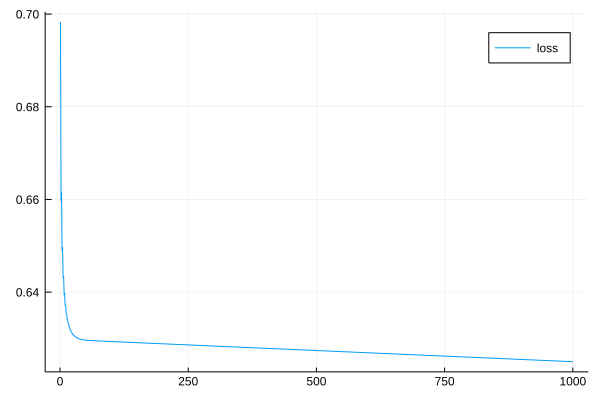

In [13]:
T = 1000
xs = bgd(θ_0)
values = map(t -> xs[t][2], 1:T)
plot(1:T, values, label="loss")

In [14]:
θ_T = xs[T][1]

3-element Array{Float64,1}:
 -0.06946097459445379  
  0.010907328656905298 
  0.0009913547184689556

In [15]:
using Optim

In [16]:
# Rosenblock function f(x), x = (x1, x2)
# f(x) = (1 - x1)^2 + 100(x2 - x1^2)^2
f(x) = (1 - x[1])^2 + 100 * (x[2] - x[1]^2)^2
x_best = optimize(f, [0.0, 0.0])


Results of Optimization Algorithm
 * Algorithm: Nelder-Mead
 * Starting Point: [0.0,0.0]
 * Minimizer: [0.9999634355313174,0.9999315506115275]
 * Minimum: 3.525527e-09
 * Iterations: 60
 * Convergence: true
   *  √(Σ(yᵢ-ȳ)²)/n < 1.0e-08: true
   * Reached Maximum Number of Iterations: false
 * Objective Calls: 118

In [17]:
# Quasi-Newton BFGS; limited memory BFGS: L-BFGS
function gradient!(∇, x)
    ∇[1] = -2*(1-x[1]) - 400(x[2] - x[1]^2)*x[1]
    ∇[2] = 200(x[2]-x[1]^2)
end

gradient! (generic function with 1 method)

In [18]:
x_best_bfgs = optimize(f, gradient!, [0.0, 0.0], LBFGS())

Results of Optimization Algorithm
 * Algorithm: L-BFGS
 * Starting Point: [0.0,0.0]
 * Minimizer: [0.999999999999928,0.9999999999998559]
 * Minimum: 5.191703e-27
 * Iterations: 24
 * Convergence: true
   * |x - x'| ≤ 0.0e+00: false 
     |x - x'| = 4.58e-11 
   * |f(x) - f(x')| ≤ 0.0e+00 |f(x)|: false
     |f(x) - f(x')| = 8.50e+07 |f(x)|
   * |g(x)| ≤ 1.0e-08: true 
     |g(x)| = 1.44e-13 
   * Stopped by an increasing objective: false
   * Reached Maximum Number of Iterations: false
 * Objective Calls: 67
 * Gradient Calls: 67

In [19]:
x1 = -5:0.01:5
x2 = -5:0.01:5
M = length(x1)
U = repeat(x1', M, 1)
V = repeat(x2, 1, M)
f(u, v) = (1 - u)^2 + 100 * (v - u^2)^2
W = map(f, U, V);

In [20]:
plot3d(U, V, W, label="", fill=true, color=:red)

In [21]:
# Back to Logistic Regression

D = size(X,2)
θ_0 = zeros(D)
result = optimize(loss, θ_0)

Results of Optimization Algorithm
 * Algorithm: Nelder-Mead
 * Starting Point: [0.0,0.0,0.0]
 * Minimizer: [-25.162619257493436,0.2062426158179525, ...]
 * Minimum: 2.034977e-01
 * Iterations: 118
 * Convergence: true
   *  √(Σ(yᵢ-ȳ)²)/n < 1.0e-08: true
   * Reached Maximum Number of Iterations: false
 * Objective Calls: 219

In [22]:
θ_best = Optim.minimizer(result)

3-element Array{Float64,1}:
 -25.162619257493436  
   0.2062426158179525 
   0.20147741047915213

In [23]:
loss(θ_best)

0.20349770386684984

In [28]:
# Use LBFGS for Logistic Regression
function grad!(η, θ)
    h = g(X*θ)
    N = size(X,1)
    u = X'*(h - y)/N
    for j=1:length(u)
        η[j] = u[j]
    end
end

grad! (generic function with 1 method)

In [30]:
result_bfgs = optimize(loss, grad!, [0.0, 0.0, 0.0], LBFGS())

Results of Optimization Algorithm
 * Algorithm: L-BFGS
 * Starting Point: [0.0,0.0,0.0]
 * Minimizer: [-25.161333563346147,0.2062317132637092, ...]
 * Minimum: 2.034977e-01
 * Iterations: 16
 * Convergence: true
   * |x - x'| ≤ 0.0e+00: false 
     |x - x'| = 2.35e-06 
   * |f(x) - f(x')| ≤ 0.0e+00 |f(x)|: false
     |f(x) - f(x')| = 2.51e-14 |f(x)|
   * |g(x)| ≤ 1.0e-08: true 
     |g(x)| = 8.58e-10 
   * Stopped by an increasing objective: false
   * Reached Maximum Number of Iterations: false
 * Objective Calls: 58
 * Gradient Calls: 58

In [31]:
θ_best_bfgs = Optim.minimizer(result_bfgs)

3-element Array{Float64,1}:
 -25.161333563346147  
   0.2062317132637092 
   0.20147160041613388